In [4]:
from transformers import AutoModelForCausalLM, AutoTokenizer

In [5]:
import pymupdf4llm

In [2]:
pdf_file = "ECG-Sample-Report.pdf"

In [3]:
contents_of_the_pdf = pymupdf4llm.to_markdown(pdf_file)

NameError: name 'pymupdf4llm' is not defined

In [5]:
print(contents_of_the_pdf)

|Col1|Col2|Col3|Col4|Col5|Col6|Col7|Col8|Col9|Col10|Col11|Col12|Col13|Col14|Col15|Col16|Col17|Col18|Col19|Col20|Col21|Col22|Col23|Col24|Col25|Col26|Col27|Col28|Col29|Col30|Col31|Hz|
|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|
||||||||||||||||||||||||||||||||150|
||||||||||||||||||||||||||||||||5 -|
||||||||||||||||||||||||||||||||: 0.0|
||||||||||||||||||||||||||||||||ters|
||||||||||||||||||||||||||||||||Fil|
|||||||||||||||||||||||||||||||||
|||||||||||||||||||||||||||||||||
|||||||||||||||||||||||||||||||||
|||||||||||||||||||||||||||||||||
|||||||||||||||||||||||||||||||||
|||||||||||||||||||||||||||||||||
|V4||||||||V5||||||||V6||||||||||||||||
|||||||||||||||||||||||||||||||||
|||||||||||||||||||||||||||||||||
|||||||||||||||||||||||||||||||||
|||||||||||||||||||||||||||||||||
|||||||||||||||||||||||||||||||||
|||||||||||||||||||||||||||||||||
|||||||||||||||||||||||||||||||||
||||||||||||||||||

In [8]:
from pdf2image import convert_from_path

In [9]:
convert_from_path

<function pdf2image.pdf2image.convert_from_path(pdf_path: Union[str, pathlib.PurePath], dpi: int = 200, output_folder: Union[str, pathlib.PurePath] = None, first_page: int = None, last_page: int = None, fmt: str = 'ppm', jpegopt: Dict = None, thread_count: int = 1, userpw: str = None, ownerpw: str = None, use_cropbox: bool = False, strict: bool = False, transparent: bool = False, single_file: bool = False, output_file: Any = <pdf2image.generators.ThreadSafeGenerator object at 0x10724c4c0>, poppler_path: Union[str, pathlib.PurePath] = None, grayscale: bool = False, size: Union[Tuple, int] = None, paths_only: bool = False, use_pdftocairo: bool = False, timeout: int = None, hide_annotations: bool = False) -> List[PIL.Image.Image]>

In [11]:
pages = convert_from_path(pdf_file, 500)


In [12]:
for count, page in enumerate(pages):
    page.save(f'pdfout/out{count}.jpg', 'JPEG')


In [70]:
import numpy as np


In [19]:

array_10x3 = np.random.rand(10, 3)
print(array_10x3)

[[9.11296083e-03 3.87058008e-01 3.21050678e-01]
 [1.74968211e-01 8.14133145e-01 5.91680228e-01]
 [8.42092715e-01 4.74692707e-04 9.38639087e-01]
 [7.08213752e-01 2.24409268e-01 9.74461672e-01]
 [8.49956857e-01 7.38592281e-01 2.81088173e-01]
 [7.10148768e-02 8.02263987e-01 8.79513695e-01]
 [8.61433704e-01 9.08596663e-01 1.13909877e-01]
 [3.25110619e-01 9.35678122e-01 6.09667507e-01]
 [4.72632827e-01 7.31607520e-02 9.50779670e-01]
 [7.05010024e-01 6.80574363e-01 1.23277727e-01]]


In [20]:
array_10x3.shape

(10, 3)

------

In [78]:
import pandas as pd
import pandas as pd
import numpy as np
import wfdb
from tqdm import tqdm
import ast
import seaborn as sns
import matplotlib.pyplot as plt

import cv2
from skimage.morphology import skeletonize
from scipy import ndimage


In [7]:
path = './ptb-xl-a-large-publicly-available-electrocardiography-dataset-1.0.1/'

In [8]:
sampling_rate=100

NameError: name 'ecgdf' is not defined

In [9]:
def load_raw_data(df, sampling_rate, path):
    if sampling_rate == 100:
        data = [wfdb.rdsamp(path+f) for f in tqdm(df.filename_lr)]
    else:
        data = [wfdb.rdsamp(path+f) for f in tqdm(df.filename_hr)]
    data = np.array([signal for signal, meta in data])
    return data

In [10]:
ecgdf = pd.read_csv(f'{path}/ptbxl_database.csv',index_col='ecg_id')

In [11]:
ecgdf.head()

,patient_id,age,sex,height,weight,nurse,site,device,recording_date,report,...,validated_by_human,baseline_drift,static_noise,burst_noise,electrodes_problems,extra_beats,pacemaker,strat_fold,filename_lr,filename_hr
ecg_id,,,,,,,,,,,,,,,,,,,,,
1,15709.0,56.0,1,NaN,63.0,2.0,0.0,CS-12 E,1984-11-09 09:17:34,sinusrhythmus periphere niederspannung,...,True,NaN,", I-V1,",NaN,NaN,NaN,NaN,3,records100/00000/00001_lr,records500/00000/00001_hr
2,13243.0,19.0,0,NaN,70.0,2.0,0.0,CS-12 E,1984-11-14 12:55:37,sinusbradykardie sonst normales ekg,...,True,NaN,NaN,NaN,NaN,NaN,NaN,2,records100/00000/00002_lr,records500/00000/00002_hr
3,20372.0,37.0,1,NaN,69.0,2.0,0.0,CS-12 E,1984-11-15 12:49:10,sinusrhythmus normales ekg,...,True,NaN,NaN,NaN,NaN,NaN,NaN,5,records100/00000/00003_lr,records500/00000/00003_hr
4,17014.0,24.0,0,NaN,82.0,2.0,0.0,CS-12 E,1984-11-15 13:44:57,sinusrhythmus normales ekg,...,True,", II,III,AVF",NaN,NaN,NaN,NaN,NaN,3,records100/00000/00004_lr,records500/00000/00004_hr
5,17448.0,19.0,1,NaN,70.0,2.0,0.0,CS-12 E,1984-11-17 10:43:15,sinusrhythmus normales ekg,...,True,", III,AVR,AVF",NaN,NaN,NaN,NaN,NaN,4,records100/00000/00005_lr,records500/00000/00005_hr


In [12]:
ecgdf.scp_codes = ecgdf.scp_codes.apply(lambda x: ast.literal_eval(x))

In [13]:
ecgdf.head()

,patient_id,age,sex,height,weight,nurse,site,device,recording_date,report,...,validated_by_human,baseline_drift,static_noise,burst_noise,electrodes_problems,extra_beats,pacemaker,strat_fold,filename_lr,filename_hr
ecg_id,,,,,,,,,,,,,,,,,,,,,
1,15709.0,56.0,1,NaN,63.0,2.0,0.0,CS-12 E,1984-11-09 09:17:34,sinusrhythmus periphere niederspannung,...,True,NaN,", I-V1,",NaN,NaN,NaN,NaN,3,records100/00000/00001_lr,records500/00000/00001_hr
2,13243.0,19.0,0,NaN,70.0,2.0,0.0,CS-12 E,1984-11-14 12:55:37,sinusbradykardie sonst normales ekg,...,True,NaN,NaN,NaN,NaN,NaN,NaN,2,records100/00000/00002_lr,records500/00000/00002_hr
3,20372.0,37.0,1,NaN,69.0,2.0,0.0,CS-12 E,1984-11-15 12:49:10,sinusrhythmus normales ekg,...,True,NaN,NaN,NaN,NaN,NaN,NaN,5,records100/00000/00003_lr,records500/00000/00003_hr
4,17014.0,24.0,0,NaN,82.0,2.0,0.0,CS-12 E,1984-11-15 13:44:57,sinusrhythmus normales ekg,...,True,", II,III,AVF",NaN,NaN,NaN,NaN,NaN,3,records100/00000/00004_lr,records500/00000/00004_hr
5,17448.0,19.0,1,NaN,70.0,2.0,0.0,CS-12 E,1984-11-17 10:43:15,sinusrhythmus normales ekg,...,True,", III,AVR,AVF",NaN,NaN,NaN,NaN,NaN,4,records100/00000/00005_lr,records500/00000/00005_hr


In [14]:

# Load raw signal data
ecg = load_raw_data(ecgdf, sampling_rate, path)


100%|██████████| 21837/21837 [00:32<00:00, 665.77it/s]


In [15]:
print('data shpae:', ecg.shape)

data shpae: (21837, 1000, 12)


In [16]:
ecgdf[['scp_codes']]

,scp_codes
ecg_id,
1,"{'NORM': 100.0, 'LVOLT': 0.0, 'SR': 0.0}"
2,"{'NORM': 80.0, 'SBRAD': 0.0}"
3,"{'NORM': 100.0, 'SR': 0.0}"
4,"{'NORM': 100.0, 'SR': 0.0}"
5,"{'NORM': 100.0, 'SR': 0.0}"
...,...
21833,"{'NDT': 100.0, 'PVC': 100.0, 'VCLVH': 0.0, 'ST..."
21834,"{'NORM': 100.0, 'ABQRS': 0.0, 'SR': 0.0}"
21835,"{'ISCAS': 50.0, 'SR': 0.0}"


In [17]:
ecgdf

,patient_id,age,sex,height,weight,nurse,site,device,recording_date,report,...,validated_by_human,baseline_drift,static_noise,burst_noise,electrodes_problems,extra_beats,pacemaker,strat_fold,filename_lr,filename_hr
ecg_id,,,,,,,,,,,,,,,,,,,,,
1,15709.0,56.0,1,NaN,63.0,2.0,0.0,CS-12 E,1984-11-09 09:17:34,sinusrhythmus periphere niederspannung,...,True,NaN,", I-V1,",NaN,NaN,NaN,NaN,3,records100/00000/00001_lr,records500/00000/00001_hr
2,13243.0,19.0,0,NaN,70.0,2.0,0.0,CS-12 E,1984-11-14 12:55:37,sinusbradykardie sonst normales ekg,...,True,NaN,NaN,NaN,NaN,NaN,NaN,2,records100/00000/00002_lr,records500/00000/00002_hr
3,20372.0,37.0,1,NaN,69.0,2.0,0.0,CS-12 E,1984-11-15 12:49:10,sinusrhythmus normales ekg,...,True,NaN,NaN,NaN,NaN,NaN,NaN,5,records100/00000/00003_lr,records500/00000/00003_hr
4,17014.0,24.0,0,NaN,82.0,2.0,0.0,CS-12 E,1984-11-15 13:44:57,sinusrhythmus normales ekg,...,True,", II,III,AVF",NaN,NaN,NaN,NaN,NaN,3,records100/00000/00004_lr,records500/00000/00004_hr
5,17448.0,19.0,1,NaN,70.0,2.0,0.0,CS-12 E,1984-11-17 10:43:15,sinusrhythmus normales ekg,...,True,", III,AVR,AVF",NaN,NaN,NaN,NaN,NaN,4,records100/00000/00005_lr,records500/00000/00005_hr
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21833,17180.0,67.0,1,NaN,NaN,1.0,2.0,AT-60 3,2001-05-31 09:14:35,ventrikulÄre extrasystole(n) sinustachykardie ...,...,True,NaN,", alles,",NaN,NaN,1ES,NaN,7,records100/21000/21833_lr,records500/21000/21833_hr
21834,20703.0,93.0,0,NaN,NaN,1.0,2.0,AT-60 3,2001-06-05 11:33:39,sinusrhythmus lagetyp normal qrs(t) abnorm ...,...,True,NaN,NaN,NaN,NaN,NaN,NaN,4,records100/21000/21834_lr,records500/21000/21834_hr
21835,19311.0,59.0,1,NaN,NaN,1.0,2.0,AT-60 3,2001-06-08 10:30:27,sinusrhythmus lagetyp normal t abnorm in anter...,...,True,NaN,", I-AVR,",NaN,NaN,NaN,NaN,2,records100/21000/21835_lr,records500/21000/21835_hr


In [18]:
ecg[0]

array([[-0.119, -0.055,  0.064, ..., -0.026, -0.039, -0.079],
       [-0.116, -0.051,  0.065, ..., -0.031, -0.034, -0.074],
       [-0.12 , -0.044,  0.076, ..., -0.028, -0.029, -0.069],
       ...,
       [ 0.069,  0.   , -0.069, ...,  0.024, -0.041, -0.058],
       [ 0.086,  0.004, -0.081, ...,  0.242, -0.046, -0.098],
       [ 0.022, -0.031, -0.054, ...,  0.143, -0.035, -0.12 ]])

In [21]:
type(ecg)

numpy.ndarray

In [27]:
# Load scp_statements.csv for diagnostic aggregation
agg_df = pd.read_csv(path+'scp_statements.csv', index_col=0)
agg_df = agg_df[agg_df.diagnostic == 1]
print(agg_df.shape)
agg_df.head()

(44, 12)


,description,diagnostic,form,rhythm,diagnostic_class,diagnostic_subclass,Statement Category,SCP-ECG Statement Description,AHA code,aECG REFID,CDISC Code,DICOM Code
NDT,non-diagnostic T abnormalities,1.0,1.0,NaN,STTC,STTC,other ST-T descriptive statements,non-diagnostic T abnormalities,NaN,NaN,NaN,NaN
NST_,non-specific ST changes,1.0,1.0,NaN,STTC,NST_,Basic roots for coding ST-T changes and abnorm...,non-specific ST changes,145.0,MDC_ECG_RHY_STHILOST,NaN,NaN
DIG,digitalis-effect,1.0,1.0,NaN,STTC,STTC,other ST-T descriptive statements,suggests digitalis-effect,205.0,NaN,NaN,NaN
LNGQT,long QT-interval,1.0,1.0,NaN,STTC,STTC,other ST-T descriptive statements,long QT-interval,148.0,NaN,NaN,NaN
NORM,normal ECG,1.0,NaN,NaN,NORM,NORM,Normal/abnormal,normal ECG,1.0,NaN,NaN,F-000B7


In [28]:
def aggregate_supclass_diagnostic(y_dic):
    tmp = []
    for key in y_dic.keys():
        if key in agg_df.index:
            tmp.append(agg_df.loc[key].diagnostic_class)
    return list(set(tmp))
    
# Apply diagnostic superclass
ecgdf['diagnostic_superclass'] = ecgdf.scp_codes.apply(aggregate_supclass_diagnostic)
ecgdf['diagnostic_superclass_len'] = ecgdf['diagnostic_superclass'].apply(len)
ecgdf.loc[ecgdf.diagnostic_superclass_len > 1, 'diagnostic_superclass']

ecg_id
39       [MI, STTC]
45        [HYP, CD]
50         [MI, CD]
77         [MI, CD]
87       [STTC, CD]
            ...    
21815      [MI, CD]
21821    [NORM, CD]
21827    [MI, STTC]
21828    [MI, STTC]
21829    [NORM, CD]
Name: diagnostic_superclass, Length: 5158, dtype: object

In [31]:
def aggregate_subclass_diagnostic(y_dic):
    tmp = []
    for key in y_dic.keys():
        if key in agg_df.index:
            tmp.append(agg_df.loc[key].diagnostic_subclass)
    ret = list(set(tmp))
    ret = ['sub_'+r for r in ret] # to distinguish between subclass and superclass columns
    return ret

# Apply diagnostic subclass
ecgdf['diagnostic_subclass'] = ecgdf.scp_codes.apply(aggregate_subclass_diagnostic)
ecgdf['diagnostic_subclass_len'] = ecgdf['diagnostic_subclass'].apply(len)
ecgdf.loc[ecgdf.diagnostic_subclass_len > 1, 'diagnostic_subclass']

ecg_id
26                    [sub_NST_, sub_STTC]
28                    [sub_NST_, sub_STTC]
39           [sub_IMI, sub_NST_, sub_STTC]
45       [sub_RVH, sub_IRBBB, sub_RAO/RAE]
50                     [sub_LMI, sub_IVCD]
                       ...                
21821                [sub_NORM, sub_IRBBB]
21827                  [sub_IMI, sub_ISCA]
21828                  [sub_IMI, sub_ISCA]
21829                [sub_NORM, sub_IRBBB]
21832            [sub_LAFB/LPFB, sub_IVCD]
Name: diagnostic_subclass, Length: 6191, dtype: object

In [32]:
ecgdf.columns.to_list()

['patient_id',
 'age',
 'sex',
 'height',
 'weight',
 'nurse',
 'site',
 'device',
 'recording_date',
 'report',
 'scp_codes',
 'heart_axis',
 'infarction_stadium1',
 'infarction_stadium2',
 'validated_by',
 'second_opinion',
 'initial_autogenerated_report',
 'validated_by_human',
 'baseline_drift',
 'static_noise',
 'burst_noise',
 'electrodes_problems',
 'extra_beats',
 'pacemaker',
 'strat_fold',
 'filename_lr',
 'filename_hr',
 'diagnostic_superclass',
 'diagnostic_superclass_len',
 'diagnostic_subclass',
 'diagnostic_subclass_len']

In [33]:
all_superclass = pd.Series(np.concatenate(ecgdf['diagnostic_superclass'].values))
all_subclass = pd.Series(np.concatenate(ecgdf['diagnostic_subclass'].values))
superclass_cols = all_superclass.unique()
subclass_cols = all_subclass.unique()
update_cols = np.concatenate([superclass_cols, subclass_cols]) # add meta data columns
meta_cols = ['age', 'sex', 'height', 'weight', 'nurse', 'site', 'device',] # could add more columns as features

In [35]:
class ClassUpdate():
    def __init__(self, cols):
        self.cols = cols

    def __call__(self, row):
        for sc in row['diagnostic_superclass']:
            row[sc] = 1
        for sc in row['diagnostic_subclass']:
            row[sc] = 1
            
        return row

def get_data_by_folds(folds, x, y, update_cols, feature_cols):
    assert len(folds)  > 0, '# of provided folds should longer than 1'
    #print(y.strat_fold)
    filt = np.isin(y.strat_fold.values, folds)
    x_selected = x[filt]
    y_selected = y[filt]
    
    for sc in update_cols:
        y_selected[sc] = 0
        
    cls_updt = ClassUpdate(update_cols)
    
    y_selected = y_selected.apply(cls_updt, axis=1)
    
    return x_selected, y_selected[list(feature_cols)+list(update_cols)+['strat_fold']]
x_all, y_all = get_data_by_folds(np.arange(1, 11), ecg, ecgdf, update_cols, meta_cols)


In [48]:
sample_num = 1

In [38]:
superclass_cols

array(['NORM', 'MI', 'STTC', 'HYP', 'CD'], dtype=object)

In [41]:
def plot_superclass(superclass):
    filt = y_all[superclass] == 1
    y_selected = y_all.loc[filt]
    x_selected = x_all[filt]
    
    for i in range(sample_num):
        y_ = y_selected.iloc[i]
        x_ = x_selected[i]
        
        #display(y_)
        #print(y_.shape, x_.shape); assert False
        bar, axes = plt.subplots(x_.shape[1], 1, figsize=(10,10))
        title = "Superclass = {}, Age = {}, Height = {}, Weight = {}, Sex = {}, Nurse = {}, Site = {}, Device = {}".format(superclass, 
                                                                                                                           y_['age'], y_['height'], y_['weight'],
                                                                                                                           y_['sex'], y_['nurse'], y_['site'], y_['device'],)
        axes[0].set_title(title, fontsize=15)
        
        for c in np.arange(x_.shape[1]):
            sns.lineplot(x=np.arange(x_.shape[0]), y=x_[:, c], ax=axes[c])
        
        plt.tight_layout()
        plt.show()
        #assert False

In [45]:
filt = y_all['NORM'] == 1
y_selected = y_all.loc[filt]
x_selected = x_all[filt]

In [50]:
y_ = y_selected.iloc[1]
x_ = x_selected[1]

In [57]:
x_.shape

(1000, 12)

In [55]:
ecg[1].shape

(1000, 12)

In [ ]:


#display(y_)
#print(y_.shape, x_.shape); assert False
bar, axes = plt.subplots(x_.shape[1], 1, figsize=(10,10))
title = "Superclass = {}, Age = {}, Height = {}, Weight = {}, Sex = {}, Nurse = {}, Site = {}, Device = {}".format(superclass, 
                                                                                                                    y_['age'], y_['height'], y_['weight'],
                                                                                                                    y_['sex'], y_['nurse'], y_['site'], y_['device'],)
axes[0].set_title(title, fontsize=15)

for c in np.arange(x_.shape[1]):
    sns.lineplot(x=np.arange(x_.shape[0]), y=x_[:, c], ax=axes[c])

plt.tight_layout()
plt.show()
#assert False

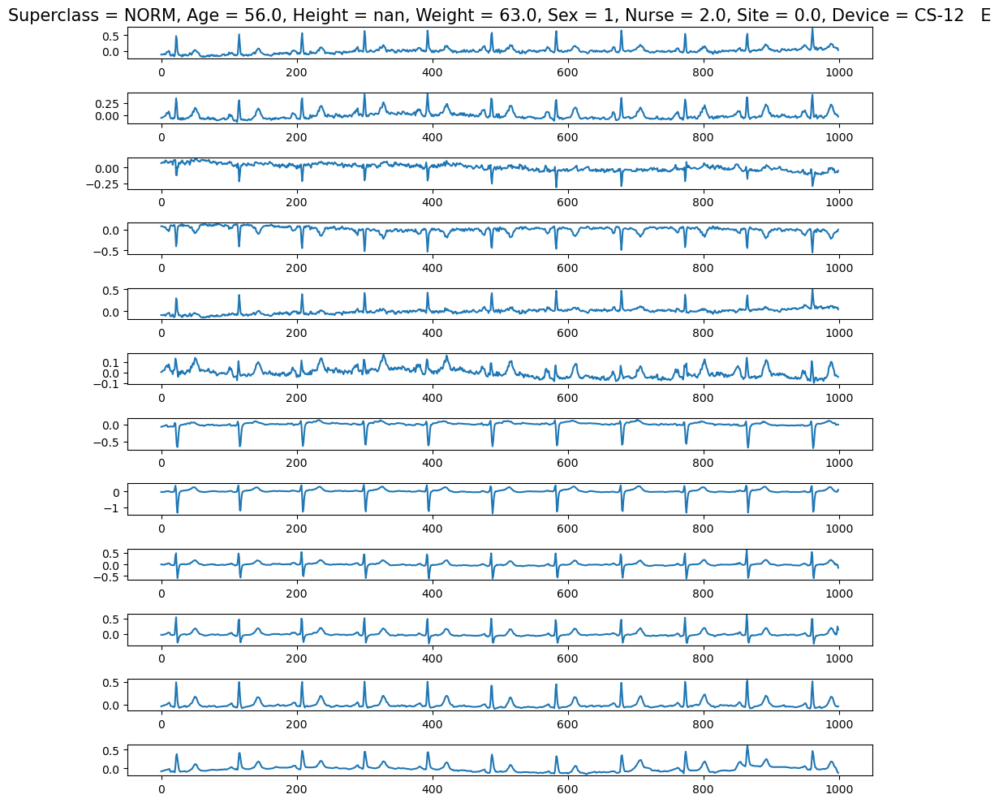

In [49]:

plot_superclass('NORM')
    

<Axes: >

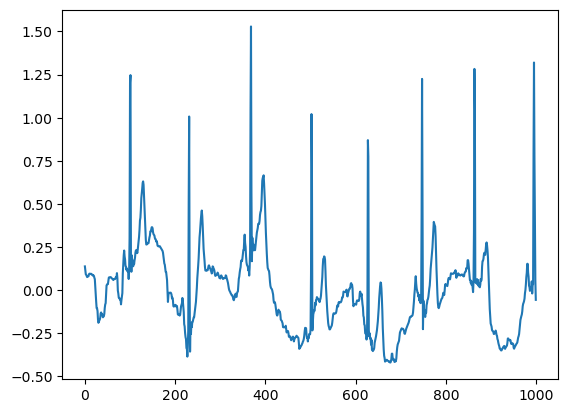

In [59]:
sns.lineplot(x=np.arange(ecg[1].shape[0]), y=ecg[1][:, 1],)

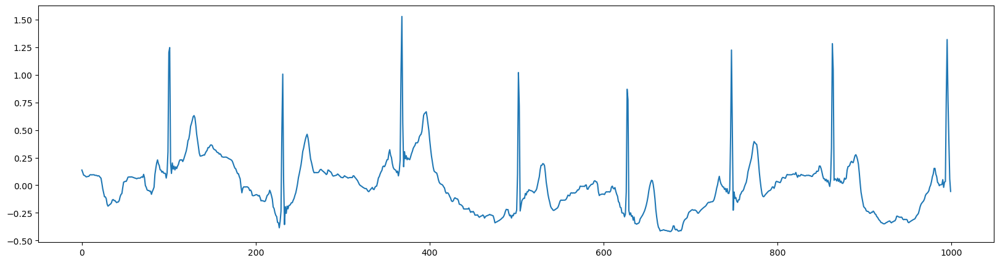

In [62]:
plt.figure(figsize=(20, 5))  # Set the width to 10 and height to 6
sns.lineplot(x=np.arange(ecg[1].shape[0]), y=ecg[1][:, 1])
plt.show()

In [71]:
ecg[1][:, 1]

array([ 1.380e-01,  1.160e-01,  9.200e-02,  8.900e-02,  8.300e-02,
        7.600e-02,  7.800e-02,  8.000e-02,  8.100e-02,  9.200e-02,
        9.600e-02,  9.400e-02,  9.500e-02,  9.500e-02,  9.500e-02,
        9.000e-02,  9.000e-02,  8.900e-02,  8.400e-02,  8.600e-02,
        8.300e-02,  7.200e-02,  6.400e-02,  1.900e-02, -3.200e-02,
       -6.700e-02, -1.040e-01, -1.050e-01, -1.210e-01, -1.700e-01,
       -1.890e-01, -1.830e-01, -1.750e-01, -1.700e-01, -1.590e-01,
       -1.340e-01, -1.290e-01, -1.390e-01, -1.380e-01, -1.490e-01,
       -1.570e-01, -1.520e-01, -1.510e-01, -1.370e-01, -1.030e-01,
       -8.300e-02, -7.500e-02, -2.100e-02,  2.800e-02,  3.200e-02,
        3.600e-02,  3.500e-02,  5.200e-02,  7.300e-02,  7.500e-02,
        7.500e-02,  7.500e-02,  7.600e-02,  7.400e-02,  7.100e-02,
        6.800e-02,  6.500e-02,  6.300e-02,  5.900e-02,  6.300e-02,
        6.500e-02,  6.500e-02,  6.500e-02,  7.200e-02,  7.700e-02,
        7.100e-02,  9.900e-02,  6.900e-02, -2.000e-03, -1.800e

In [69]:
ecg[1].shape

(1000, 12)

In [67]:
ecg[1].shape[0]

1000

In [68]:
np.arange(ecg[1].shape[0])

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 18

-----
# Reading image to digital data

 - grid color = 159,66,85,1

In [2]:
import pandas as pd
import pandas as pd
import numpy as np
import wfdb
from tqdm import tqdm
import ast
import seaborn as sns
import matplotlib.pyplot as plt

import cv2
from skimage.morphology import skeletonize
from scipy import ndimage


In [79]:

# Load the image
img_path = 'pdfout/test/t1.jpg'


In [80]:
def load_image(path):
    # load as color for later separation, then convert to grayscale
    img_color = cv2.imread(path, cv2.IMREAD_COLOR)
    gray = cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY)
    return img_color, gray

In [83]:
img_color, img_gray = load_image(img_path)


In [111]:
def deskew(img_gray):
    # detect strongest lines (the grid) via Hough and rotate to align
    edges = cv2.Canny(img_gray, 50, 150, apertureSize=3)
    lines = cv2.HoughLines(edges, 1, np.pi/180, 200)
    angles = []
    for rho,theta in lines[:,0]:
        angle = (theta - np.pi/2)
        angles.append(angle)
    # median angle
    median_angle = np.median(angles)
    deg = median_angle * 180/np.pi
    # rotate around center
    (h, w) = img_gray.shape
    M = cv2.getRotationMatrix2D((w/2,h/2), deg, 1.0)
    deskewed = cv2.warpAffine(img_gray, M, (w,h), flags=cv2.INTER_LINEAR)
    return deskewed, M

In [113]:
grey_deskew, M = deskew(img_gray)
h, w = img_gray.shape
color_deskew = cv2.warpAffine(img_color, M, (w,h))

In [90]:
def remove_grid(img_color, img_gray):
    # assume grid is red‑channel heavy (pink/red). threshold red channel
    red = img_color[:,:,2]
    # threshold to get grid mask
    _, grid_mask = cv2.threshold(red, 150, 255, cv2.THRESH_BINARY)
    # invert mask to keep everything _but_ grid
    fg_mask = cv2.bitwise_not(grid_mask)
    cleaned = cv2.bitwise_and(img_gray, img_gray, mask=fg_mask)
    return cleaned

In [ ]:
waveform_data_clean = remove_grid(color_deskew, grey_deskew)

In [105]:
unskewed_data_clean = remove_grid(img_color, img_gray )


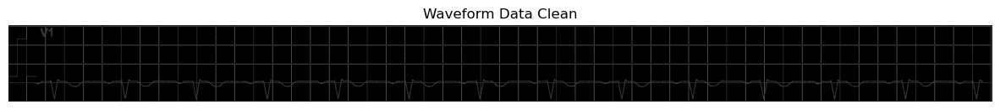

In [107]:

plt.figure(figsize=(15, 8))
plt.imshow(unskewed_data_clean, cmap='gray')
plt.title("Waveform Data Clean")
plt.axis('off')  # Hide axes for better visualization
plt.show()

In [108]:
def extract_waveform(cleaned_gray):
    # binarize (waveform is dark)
    _, bw = cv2.threshold(cleaned_gray, 0, 255,
                          cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    # skeletonize expects boolean
    bw_bool = bw > 0
    skel = skeletonize(bw_bool).astype(np.uint8)
    return skel

In [114]:
skel = extract_waveform(unskewed_data_clean)

In [115]:
skel

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 1, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [117]:
def column_to_trace(skel):
    h, w = skel.shape
    ys = np.full(w, np.nan)
    for x in range(w):
        ys_in_col = np.where(skel[:,x]>0)[0]
        if len(ys_in_col):
            # take mean y if multiple branches
            ys[x] = ys_in_col.mean()
    return ys


In [118]:
ys = column_to_trace(skel)
xs = np.arange(len(ys))

In [119]:
def pixels_to_physical(xs, ys, pixels_per_mm=10,
                       time_per_mm=0.04,  # 25mm/s => 1mm = 0.04s
                       volt_per_mm=0.1,   # 10mm/mV => 1mm = 0.1mV
                       baseline_y=None):
    # if baseline_y not given, take median of all ys as zero-line
    if baseline_y is None:
        baseline_y = np.nanmedian(ys)
    # compute time and voltage arrays
    t = (xs / pixels_per_mm) * time_per_mm
    v = ((baseline_y - ys) / pixels_per_mm) * volt_per_mm
    return t, v

In [120]:
t, v = pixels_to_physical(xs, ys, pixels_per_mm=10)

In [126]:
v

array([       nan, 2.1425    , 2.1525    , ..., 0.14513298,        nan,
              nan])

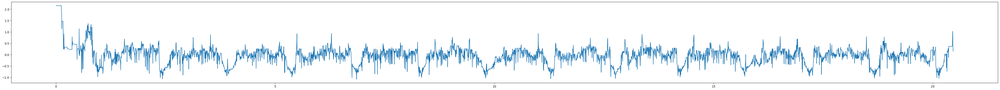

In [129]:
plt.figure(figsize=(60, 5))  # Set the width to 10 and height to 6
sns.lineplot(x=t, y=v)
plt.show()

-----
### attemt 2

In [3]:
img_path = 'pdfout/test/t1.jpg'

In [4]:
img_color = cv2.imread(img_path, cv2.IMREAD_COLOR)
img_color = cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)

In [5]:
img_color.shape

(400, 5119, 3)

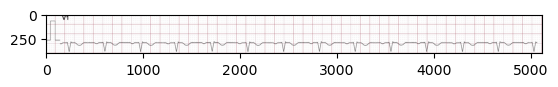

In [6]:
plt.imshow(img_color)

Text(0, 0.5, 'Pixel count')

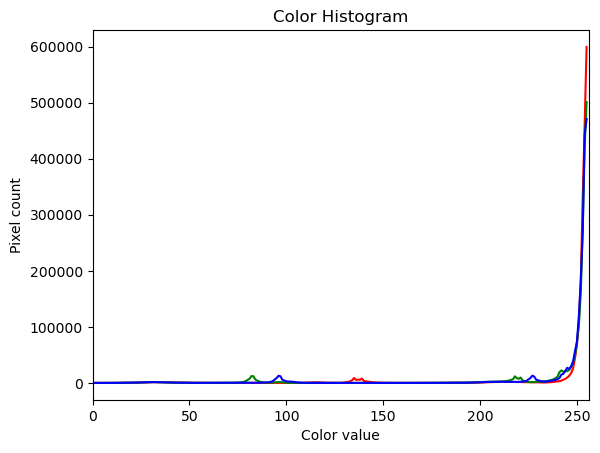

In [7]:
# tuple to select colors of each channel line
colors = ("red", "green", "blue")

# create the histogram plot, with three lines, one for
# each color
fig, ax = plt.subplots()
ax.set_xlim([0, 256])
for channel_id, color in enumerate(colors):
    histogram, bin_edges = np.histogram(
        img_color[:, :, channel_id], bins=256, range=(0, 256)
    )
    ax.plot(bin_edges[0:-1], histogram, color=color)

ax.set_title("Color Histogram")
ax.set_xlabel("Color value")
ax.set_ylabel("Pixel count")

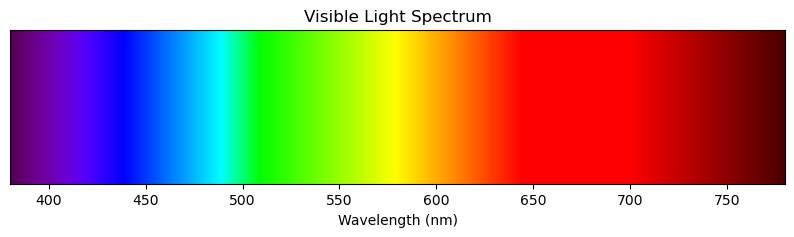

In [47]:
def wavelength_to_rgb(wavelength):
    # Convert a wavelength in the range 380-780 nm to an RGB color.
    if 380 <= wavelength < 440:
        r = -(wavelength - 440) / (440 - 380)
        g = 0.0
        b = 1.0
    elif 440 <= wavelength < 490:
        r = 0.0
        g = (wavelength - 440) / (490 - 440)
        b = 1.0
    elif 490 <= wavelength < 510:
        r = 0.0
        g = 1.0
        b = -(wavelength - 510) / (510 - 490)
    elif 510 <= wavelength < 580:
        r = (wavelength - 510) / (580 - 510)
        g = 1.0
        b = 0.0
    elif 580 <= wavelength < 645:
        r = 1.0
        g = -(wavelength - 645) / (645 - 580)
        b = 0.0
    elif 645 <= wavelength <= 780:
        r = 1.0
        g = 0.0
        b = 0.0
    else:
        r = g = b = 0.0

    # Intensity correction near vision limits
    if 380 <= wavelength < 420:
        factor = 0.3 + 0.7 * (wavelength - 380) / (420 - 380)
    elif 420 <= wavelength <= 700:
        factor = 1.0
    elif 700 < wavelength <= 780:
        factor = 0.3 + 0.7 * (780 - wavelength) / (780 - 700)
    else:
        factor = 0.0
    return (r * factor, g * factor, b * factor)

# Create wavelengths and corresponding colors
wavelengths = np.linspace(380, 780, 400)
spectrum_colors = [wavelength_to_rgb(w) for w in wavelengths]

# Plot the spectrum as vertical color bands
# Here we use ax.axvline to draw each colored line segment
fig, ax = plt.subplots(figsize=(10, 2))
for w, color in zip(wavelengths, spectrum_colors):
    ax.axvline(x=w, color=color, linewidth=4)

ax.set_xlim(380, 780)
ax.set_yticks([])
ax.set_xlabel("Wavelength (nm)")
ax.set_title("Visible Light Spectrum")
plt.show()

In [ ]:
# Convert image to grayscale using luminosity weights
# This yields an array of shape (height, width)
gray = np.dot(img_color[...,:3], np.array([0.2989, 0.5870, 0.1140]))
# Compute the average intensity for each column
col_intensity = gray.mean(axis=0)

# Map each column index to a wavelength between 380 and 780 nm
width = img_color.shape[1]
wavelengths_img = np.linspace(380, 780, width)

# Set the width for each bar in the histogram
bar_width = (780 - 380) / width

plt.figure(figsize=(10, 5))
# Create a bar plot for each wavelength with corresponding intensity.
plt.bar(
    wavelengths_img,
    col_intensity,
    width=bar_width,
    color=[wavelength_to_rgb(w) for w in wavelengths_img],
    edgecolor='none'
)
plt.xlabel("Wavelength (nm)")
plt.ylabel("Intensity")
plt.title("Intensity Histogram from Image")
plt.show()


In [26]:
img_filtered = img_color.copy()
img_filtered[img_filtered > 200] = 255
img_filtered[img_filtered < 50] = 0
# img_filtered[(img_filtered > 100) & (img_filtered < 200)] = 127

In [31]:
def rgb_to_hex(rgb):
    return '#{:02X}{:02X}{:02X}'.format(rgb[0], rgb[1], rgb[2])

# Convert each pixel in img_color from RGB to hexadecimal.
hex_image = np.apply_along_axis(rgb_to_hex, 2, img_filtered)
print(hex_image)

[['#FFFFFF' '#FFFFFF' '#FFFFFF' ... '#FFFFFF' '#FFFFFF' '#FFFFFF']
 ['#FFFFFF' '#FFFFFF' '#FFFFFF' ... '#FFFFFF' '#FFFFFF' '#FFFFFF']
 ['#FFFFFF' '#FFFFFF' '#FFFFFF' ... '#FFFFFF' '#FFFFFF' '#FFFFFF']
 ...
 ['#FFFFFF' '#FFFFFF' '#FFFFFF' ... '#FFFFFF' '#FFFFFF' '#FFFFFF']
 ['#FFFFFF' '#FFFFFF' '#FFFFFF' ... '#FFFFFF' '#FFFFFF' '#FFFFFF']
 ['#84525D' '#85535E' '#86545F' ... '#8C4853' '#905B61' '#88555C']]


In [35]:
hex_colors = [f"#{i:06X}" for i in range(0x1000000)]

In [37]:
len(hex_colors)

16777216

In [39]:
hex_colors[-1]

'#FFFFFF'

In [40]:
unique_hex, counts = np.unique(hex_image, return_counts=True)

(array([2.869400e+04, 1.976000e+03, 8.969000e+03, 3.272000e+03,
        3.134200e+04, 2.652500e+04, 3.633000e+03, 1.356000e+03,
        2.015000e+03, 1.939818e+06]),
 array([   0. ,  690.4, 1380.8, 2071.2, 2761.6, 3452. , 4142.4, 4832.8,
        5523.2, 6213.6, 6904. ]),
 <BarContainer object of 10 artists>)

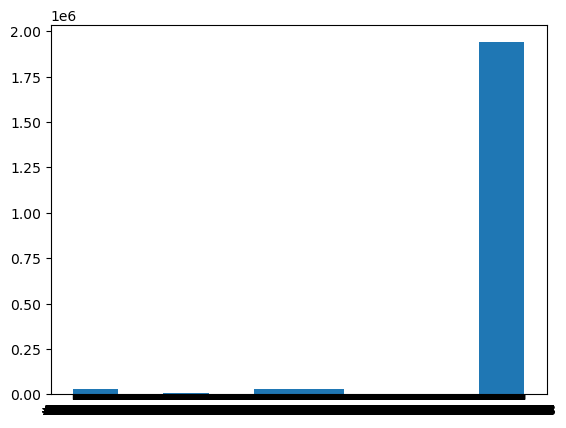

In [46]:
plt.hist(unique_hex, weights=counts)

In [41]:
unique_hex.shape

(6905,)

In [ ]:
# Print the unique hexadecimal values and their frequencies
# print("Unique hexadecimal values in hex_image:")
# for hex_val, count in zip(unique_hex, counts):
#     print(f"{hex_val}: {count}")

# Optionally, create a DataFrame for further analysis
hist_df = pd.DataFrame({'hex': unique_hex, 'frequency': counts})
print(hist_df.sort_values('frequency', ascending=False))

Unique hexadecimal values in hex_image:
          hex  frequency
6904  #FFFFFF    1925697
0     #000000      24582
3188  #875360       4878
3567  #8B5261       4372
3372  #895361       1425
...       ...        ...
4260  #926E7A          1
4261  #927D84          1
4262  #928187          1
4263  #92878B          1
577   #4F383E          1

[6905 rows x 2 columns]


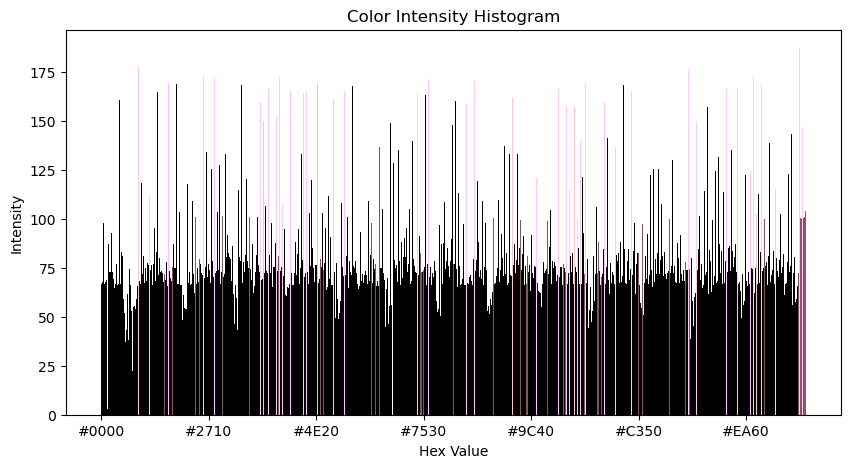

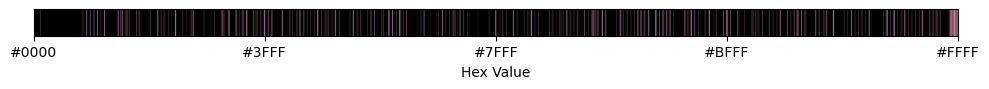

In [34]:
from matplotlib.ticker import FuncFormatter
import matplotlib.colors as mcolors

# Plot color intensity histogram with x-axis labels from #0000 to #FFFF
fig, ax_hist = plt.subplots(figsize=(10, 5))
ax_hist.bar(x, col_intensity, width=bar_w, color=col_colors, align='edge')
ax_hist.set_xlabel("Hex Value")
ax_hist.set_ylabel("Intensity")
ax_hist.set_title("Color Intensity Histogram")
ax_hist.xaxis.set_major_formatter(FuncFormatter(lambda val, pos: f"#{int(val):04X}"))
plt.show()

# Plot the color bar below showing the correspondence in hex colors
fig_color, ax_color = plt.subplots(figsize=(10, 1))
# Build the gradient using the hex colors for each column
gradient_rgb = np.array([mcolors.to_rgb(c) for c in col_colors]).reshape(1, width, 3)
ax_color.imshow(gradient_rgb, aspect='auto')
# Set x-ticks corresponding to hex values from 0 to 0xFFFF
ticks = np.linspace(0, width - 1, 5, dtype=int)
ax_color.set_xticks(ticks)
tick_vals = np.linspace(0, 65535, 5)
ax_color.set_xticklabels([f"#{int(val):04X}" for val in tick_vals])
ax_color.set_yticks([])
ax_color.set_xlabel("Hex Value")
plt.tight_layout()
plt.show()

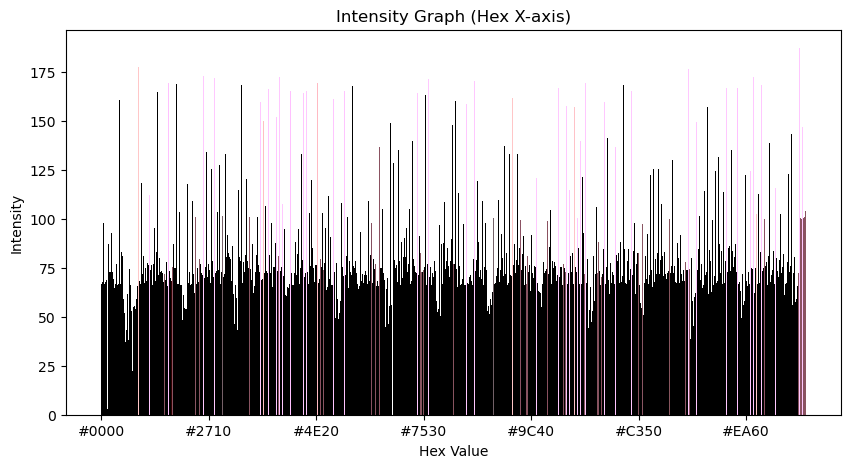

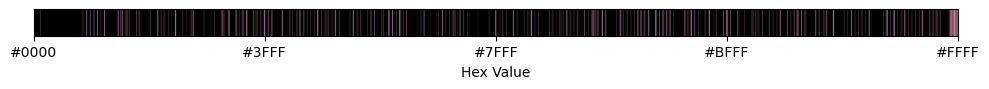

In [30]:
import collections
from matplotlib.ticker import FuncFormatter

import matplotlib.colors as mcolors

# Compute dominant (mode) hex color for each column (ignoring white).
col_colors = []
for i in range(width):
    col_vals = hex_image[:, i]
    valid = [c for c in col_vals if c.upper() != '#FFFFFF']
    if valid:
        mode_color = collections.Counter(valid).most_common(1)[0][0]
    else:
        mode_color = '#FFFFFF'
    col_colors.append(mode_color)

# Map column indices to numbers from 0 to 65535.
x = np.linspace(0, 65535, width)
bar_w = 65535 / width

fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(x, col_intensity, width=bar_w, color=col_colors, align='edge')
ax.set_xlabel("Hex Value")
ax.set_ylabel("Intensity")
ax.set_title("Intensity Graph (Hex X-axis)")

# Format x-axis ticks as hex values with 4 digits.
ax.xaxis.set_major_formatter(FuncFormatter(lambda val, pos: f"#{int(val):04X}"))

# Create a horizontal gradient below to show the hex colors.
fig2, cbar_ax = plt.subplots(figsize=(10, 1))
# Build an array (1 x width) of RGB colors (using the hex values)
gradient_rgb = np.array([mcolors.to_rgb(c) for c in col_colors]).reshape(1, width, 3)
cbar_img = cbar_ax.imshow(gradient_rgb, aspect='auto')
cbar_ax.set_xticks(np.linspace(0, width - 1, 5, dtype=int))
cbar_ax.set_xticklabels([f"#{int(val):04X}" for val in np.linspace(0, 65535, 5)])
cbar_ax.set_yticks([])
cbar_ax.set_xlabel("Hex Value")
plt.tight_layout()
plt.show()


---
### Atttempt 3

In [57]:
img_filtered = img_color.copy()
img_filtered[img_filtered > 200] = 255
img_filtered[img_filtered < 50] = 0
# img_filtered[(img_filtered > 100) & (img_filtered < 200)] = 127

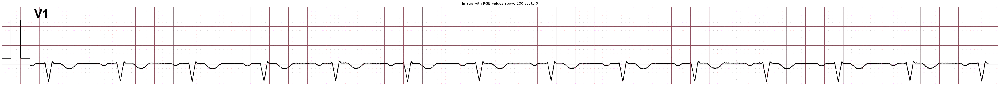

In [60]:
plt.figure(figsize=(60, 10))  # Adjust width and height as needed
plt.imshow(img_filtered)
plt.title("Image with RGB values above 200 set to 0")
plt.axis('off')
plt.show()

In [64]:
# Reshape the filtered image to a list of RGB pixels
pixels = img_filtered.reshape(-1, 3)

# Find unique colors and their counts
unique_colors, counts = np.unique(pixels, axis=0, return_counts=True)

# Sort colors by frequency (descending)
sorted_idx = np.argsort(counts)[::-1]
dominant_colors = unique_colors[sorted_idx]

# Optionally, retrieve the top N most prominent colors (e.g., top 10)
top_n = 10
top_colors = dominant_colors[:top_n]

# Function to convert an RGB color to hexadecimal string
def rgb_to_hex(rgb):
    return '#{:02X}{:02X}{:02X}'.format(rgb[0], rgb[1], rgb[2])

# Convert the top colors to hex format
top_colors_hex = [rgb_to_hex(color) for color in top_colors]

print("Most prominent colours (top {}):".format(top_n), top_colors)

Most prominent colours (top 10): [[255 255 255]
 [  0   0   0]
 [135  83  96]
 [139  82  97]
 [137  83  97]
 [255 200 255]
 [134  82  95]
 [136  82  96]
 [138  81  96]
 [136  84  97]]


In [65]:
top_colors

array([[255, 255, 255],
       [  0,   0,   0],
       [135,  83,  96],
       [139,  82,  97],
       [137,  83,  97],
       [255, 200, 255],
       [134,  82,  95],
       [136,  82,  96],
       [138,  81,  96],
       [136,  84,  97]], dtype=uint8)

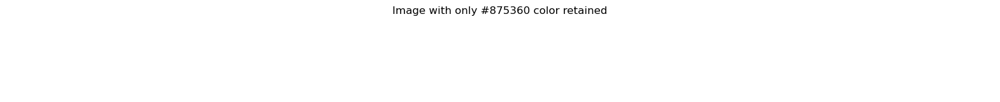

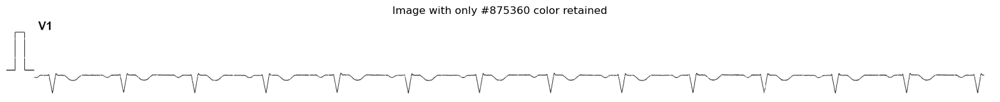

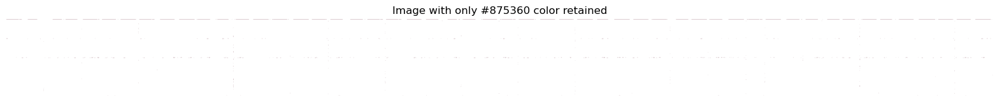

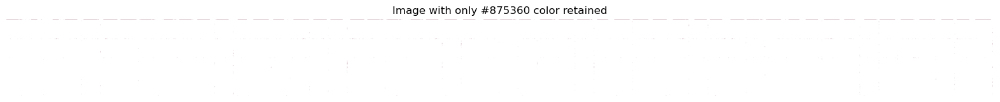

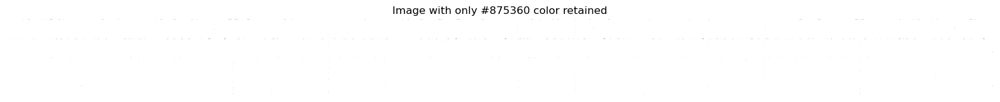

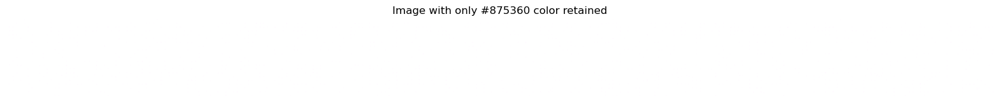

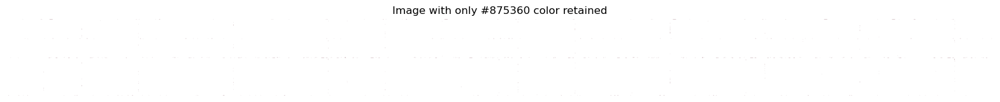

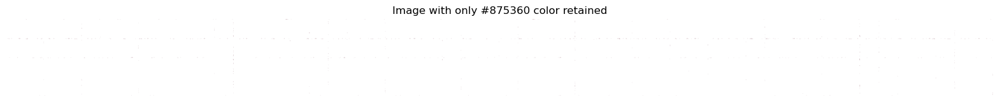

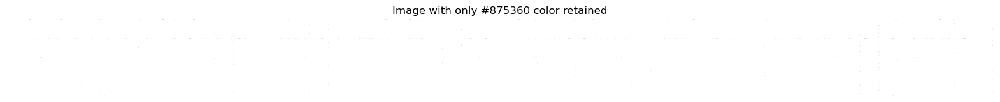

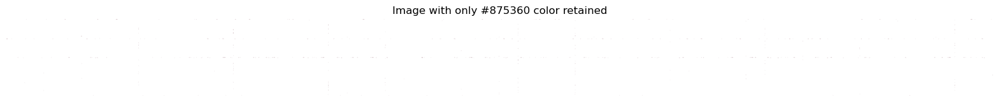

In [66]:
for col in top_colors:
    # Create a copy of img_filtered to preserve the original image
    result_img = np.copy(img_filtered)

    # Define the target color (#875360) as an RGB array
    target_color = np.array(col, dtype=np.uint8)

    # Create a boolean mask True where the pixel equals the target color
    mask = np.all(result_img == target_color, axis=2)

    # Set pixels not matching the target color to white (255)
    result_img[~mask] = 255

    # Display the resulting image
    plt.figure(figsize=(20, 8))
    plt.imshow(result_img)
    plt.title("Image with only #875360 color retained")
    plt.axis("off")
    plt.show()

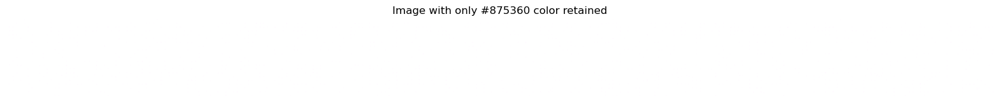

In [54]:
# Create a copy of img_filtered to preserve the original image
result_img = np.copy(img_filtered)

# Define the target color (#875360) as an RGB array
target_color = np.array([255, 200 ,255], dtype=np.uint8)

# Create a boolean mask True where the pixel equals the target color
mask = np.all(result_img == target_color, axis=2)

# Set pixels not matching the target color to white (255)
result_img[~mask] = 255

# Display the resulting image
plt.figure(figsize=(20, 8))
plt.imshow(result_img)
plt.title("Image with only #875360 color retained")
plt.axis("off")
plt.show()

In [85]:
img_filtered_2 = img_color.copy()
# Split the channels into r, g, b
r, g, b = cv2.split(img_filtered_2)

# Apply thresholds for each channel separately
r[r > 200] = 255
r[r < 50] = 0

g[g > 200] = 255
g[g < 50] = 0

b[b > 200] = 255
b[b < 50] = 0

# Merge channels back together
img_filtered_2 = cv2.merge([r, g, b])

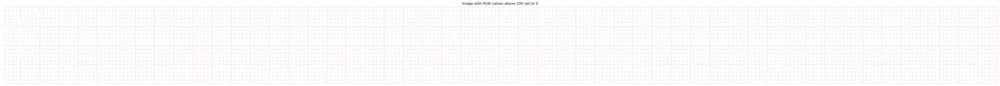

In [112]:
def apply_filter(img, lower, upper, val):
    mask = cv2.inRange(img, lower, upper)
    img[mask == 0] = val
    return img
img_filtered_2 = img_color.copy()
lower_bound = np.array([200, 200, 200], dtype=np.uint8)
upper_bound = np.array([255, 255, 255], dtype=np.uint8)
img_filtered_2 = apply_filter(img_filtered_2,lower_bound,upper_bound,255)
plt.figure(figsize=(60, 10))  # Adjust width and height as needed
plt.imshow(img_filtered_2)
plt.title("Image with RGB values above 200 set to 0")
plt.axis('off')
plt.show()


In [119]:
def apply_filter(img, lower, upper, val):
    mask = cv2.inRange(img, lower, upper)
    img[mask == 1] = val
    return img

In [120]:
img_filtered_2 = img_color.copy()
lower_bound = np.array([200, 200, 200], dtype=np.uint8)
upper_bound = np.array([255, 255, 255], dtype=np.uint8)
img_filtered_2 = apply_filter(img_filtered_2,lower_bound,upper_bound,255)

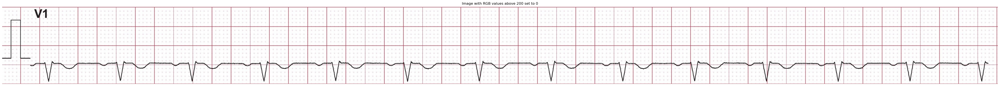

In [121]:
plt.figure(figsize=(60, 10))  # Adjust width and height as needed
plt.imshow(img_filtered_2)
plt.title("Image with RGB values above 200 set to 0")
plt.axis('off')
plt.show()

In [132]:
img_filtered_3 = img_filtered_2.copy()
lower_bound = np.array([0, 0, 0], dtype=np.uint8)
upper_bound = np.array([50, 50, 50], dtype=np.uint8)
img_filtered_3 = apply_filter(img_filtered_3,lower_bound,upper_bound,255)

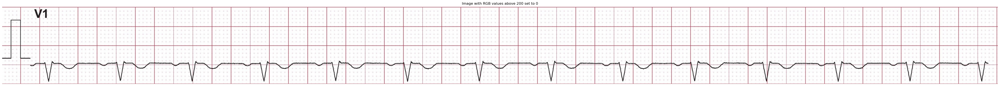

In [133]:
plt.figure(figsize=(60, 10))  # Adjust width and height as needed
plt.imshow(img_filtered_3)
plt.title("Image with RGB values above 200 set to 0")
plt.axis('off')
plt.show()

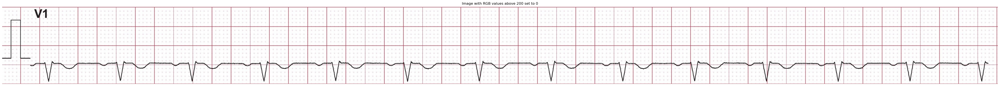

In [113]:
plt.figure(figsize=(60, 10))  # Adjust width and height as needed
plt.imshow(img_color)
plt.title("Image with RGB values above 200 set to 0")
plt.axis('off')
plt.show()

In [134]:
img_grey_filter = img_filtered_3.copy()
img_grey_filter = cv2.cvtColor(img_grey_filter, cv2.COLOR_RGB2GRAY)


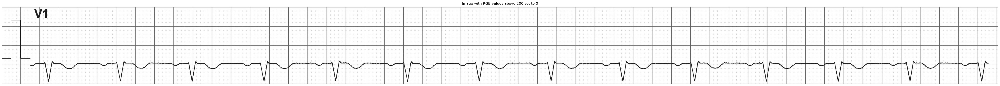

In [144]:
plt.figure(figsize=(60, 10))  # Adjust width and height as needed
plt.imshow(img_grey_filter, cmap='gray')
plt.title("Image with RGB values above 200 set to 0")
plt.axis('off')
plt.show()

In [135]:
img_grey_filter.shape

(400, 5119)

In [141]:
img_grey_filter.flatten().shape

(2047600,)

In [145]:
img_grey_filtered = img_grey_filter.copy()
img_grey_filtered[img_grey_filtered > 200] = 255
# img_grey_filtered[img_grey_filtered < 50] = 0
# img_filtered[(img_filtered > 100) & (img_filtered < 200)] = 127

In [147]:
img_grey_filtered[img_grey_filtered < 50] = 0


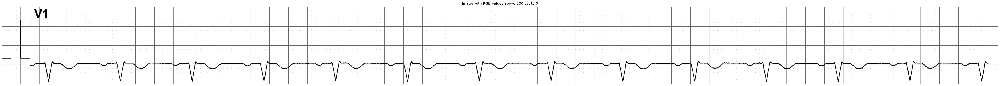

In [148]:
plt.figure(figsize=(60, 10))  # Adjust width and height as needed
plt.imshow(img_grey_filtered, cmap='gray')
plt.title("Image with RGB values above 200 set to 0")
plt.axis('off')
plt.show()

In [199]:
artifacts_filter = img_grey_filtered.copy()

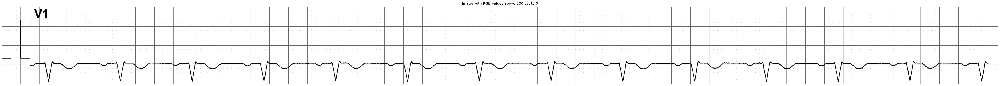

In [205]:
artifacts_filter_1 = img_grey_filtered.copy()
# Generate intermediate image; use morphological closing to keep parts of the brain together
inter = cv2.morphologyEx(artifacts_filter_1, cv2.MORPH_CLOSE, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5)))

# Find largest contour in intermediate image
cnts, _ = cv2.findContours(inter, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
cnt = max(cnts, key=cv2.contourArea)

# Output
out = np.zeros(artifacts_filter_1.shape, np.uint8)
cv2.drawContours(out, [cnt], -1, 255, cv2.FILLED)
out = cv2.bitwise_and(artifacts_filter_1, out)

plt.figure(figsize=(60, 10))  # Adjust width and height as needed
plt.imshow(out, cmap='gray')
plt.title("Image with RGB values above 200 set to 0")
plt.axis('off')
plt.show()

In [203]:
artifacts_filter = cv2.medianBlur(artifacts_filter, 1) 


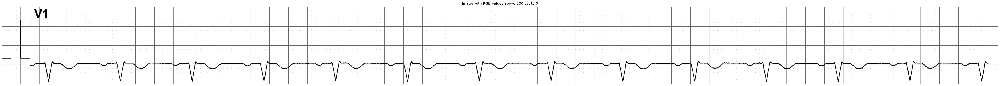

In [204]:
plt.figure(figsize=(60, 10))  # Adjust width and height as needed
plt.imshow(artifacts_filter.astype(np.uint8), cmap='gray')
plt.title("Image with RGB values above 200 set to 0")
plt.axis('off')
plt.show()

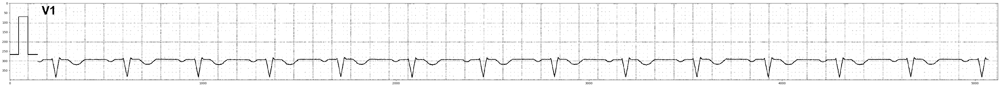

In [195]:
mask=cv2.morphologyEx(artifacts_filter,cv2.MORPH_CLOSE,np.ones((20,40))) # this will connect letters together
out = cv2.connectedComponentsWithStats(mask, 4, cv2.CV_32S) # count pixel in each blob
bad = out[2][:,cv2.CC_STAT_AREA]<2000 %3
mask = np.zeros_like(artifacts_filter,dtype=np.uint8)
for i in range(1,out[0]):
    if not bad[i]:
        mask[out[1] == i] = 1
img_clean = artifacts_filter & mask
plt.figure(figsize=(60, 10))
plt.imshow(img_clean,interpolation="none",cmap='gray')

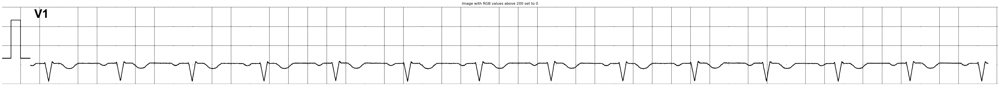

In [164]:
plt.figure(figsize=(60, 10))  # Adjust width and height as needed
plt.imshow(artifacts_filter, cmap='gray')
plt.title("Image with RGB values above 200 set to 0")
plt.axis('off')
plt.show()

(array([5.00000e+00, 7.00000e+00, 5.00000e+00, 7.00000e+00, 7.00000e+00,
        1.00000e+01, 1.30000e+01, 2.20000e+01, 4.00000e+01, 3.50000e+01,
        4.00000e+01, 4.10000e+01, 7.10000e+01, 9.20000e+01, 1.11000e+02,
        1.19000e+02, 1.61000e+02, 1.82000e+02, 2.44000e+02, 2.63000e+02,
        3.22000e+02, 4.17000e+02, 5.09000e+02, 6.14000e+02, 6.69000e+02,
        7.93000e+02, 8.87000e+02, 9.86000e+02, 1.09400e+03, 1.26600e+03,
        1.37700e+03, 1.55800e+03, 1.62100e+03, 1.35600e+03, 1.34900e+03,
        1.21100e+03, 1.12300e+03, 1.10300e+03, 9.36000e+02, 9.22000e+02,
        7.76000e+02, 6.41000e+02, 5.67000e+02, 5.14000e+02, 4.35000e+02,
        4.11000e+02, 3.31000e+02, 2.72000e+02, 2.49000e+02, 2.22000e+02,
        1.92000e+02, 1.86000e+02, 1.48000e+02, 1.65000e+02, 1.56000e+02,
        1.19000e+02, 1.31000e+02, 9.20000e+01, 1.04000e+02, 8.90000e+01,
        8.70000e+01, 9.20000e+01, 7.50000e+01, 6.90000e+01, 7.10000e+01,
        6.00000e+01, 7.40000e+01, 6.60000e+01, 7.40

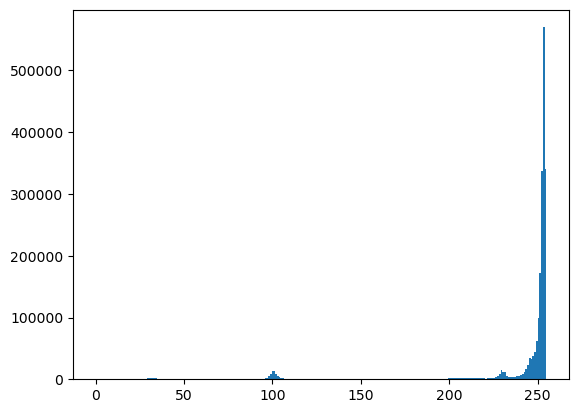

In [142]:
plt.hist(img_grey_filter.flatten(), bins=256)

In [137]:
unique_vals, counts = np.unique(img_grey_filter, return_counts=True)
sorted_idx = np.argsort(counts)[::-1]
top_10_vals = unique_vals[sorted_idx][:10]
top_10_counts = counts[sorted_idx][:10]

print("Top 10 prominent grey shades:")
for shade, cnt in zip(top_10_vals, top_10_counts):
    print(f"Intensity: {shade}, Count: {cnt}")

Top 10 prominent grey shades:
Intensity: 254, Count: 569785
Intensity: 255, Count: 341009
Intensity: 253, Count: 336666
Intensity: 252, Count: 171559
Intensity: 251, Count: 98383
Intensity: 250, Count: 62638
Intensity: 249, Count: 43530
Intensity: 248, Count: 37621
Intensity: 246, Count: 34938
Intensity: 247, Count: 33261


In [138]:
top_10_vals

array([254, 255, 253, 252, 251, 250, 249, 248, 246, 247], dtype=uint8)

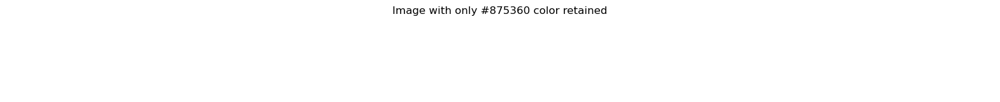

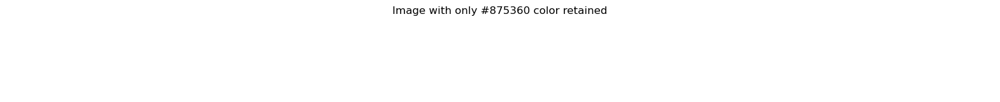

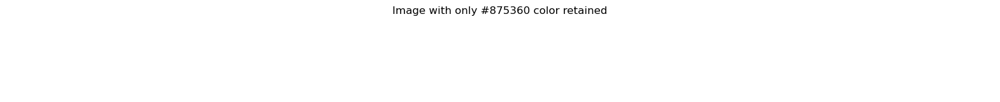

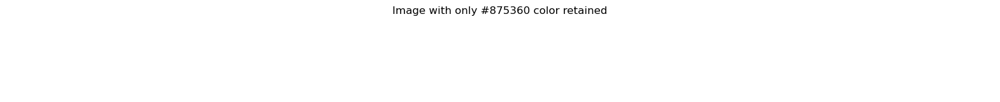

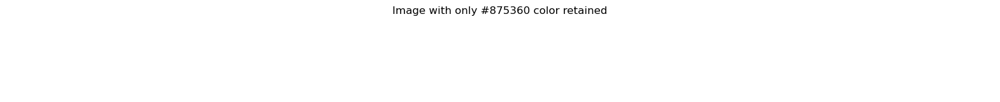

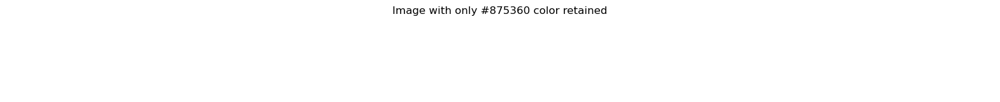

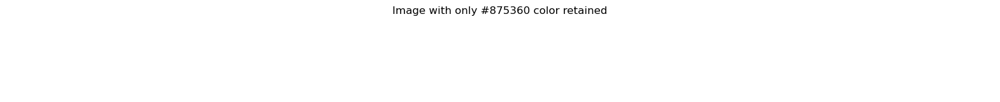

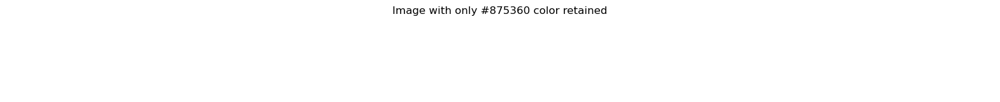

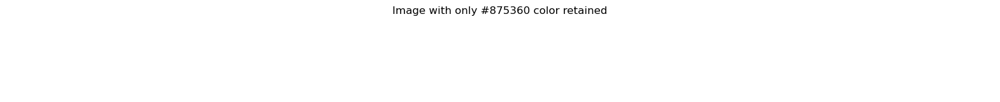

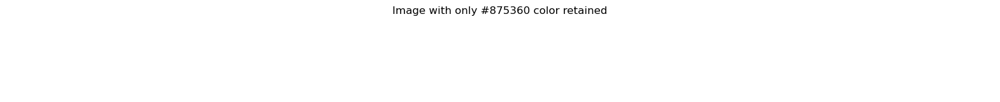

In [139]:
for col in top_10_vals:
    # Create a copy of img_filtered to preserve the original image
    result_img = np.copy(img_filtered)

    # Define the target color (#875360) as an RGB array
    target_color = np.array(col, dtype=np.uint8)

    # Create a boolean mask True where the pixel equals the target color
    mask = np.all(result_img == target_color, axis=2)

    # Set pixels not matching the target color to white (255)
    result_img[~mask] = 255

    # Display the resulting image
    plt.figure(figsize=(20, 8))
    plt.imshow(result_img)
    plt.title("Image with only #875360 color retained")
    plt.axis("off")
    plt.show()

----
### attempt 3

In [79]:
img_to_filter = img_color.copy()
img_to_filter = cv2.cvtColor(img_to_filter, cv2.COLOR_RGB2BGR)

In [80]:
def extract_grid_hsv(img_bgr):
    """
    Simple HSV‐threshold method for pink/red grid.
    """
    hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)

    # pink/red lives near hue=0 (wraps around), with medium‐high saturation & value.
    lower1 = np.array([  0,  40,  40])
    upper1 = np.array([ 10, 255, 255])
    lower2 = np.array([170,  40,  40])
    upper2 = np.array([180, 255, 255])

    m1 = cv2.inRange(hsv, lower1, upper1)
    m2 = cv2.inRange(hsv, lower2, upper2)
    mask = cv2.bitwise_or(m1, m2)

    # clean up small speckles on/off
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN,  kernel, iterations=1)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=1)
    return mask

In [81]:
mask_grid = extract_grid_hsv(img_to_filter)

In [82]:
grid_only = cv2.bitwise_and(img_to_filter, img_to_filter, mask=mask_grid)


In [83]:

# 3) ECG-only image (everything else)
mask_ecg = cv2.bitwise_not(mask_grid)
ecg_only = cv2.bitwise_and(img_to_filter, img_to_filter, mask=mask_ecg)

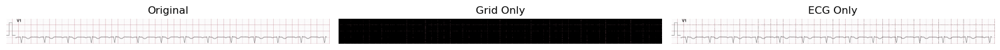

In [84]:


# show results
plt.figure(figsize=(16, 6))
plt.subplot(1,3,1)
plt.imshow(cv2.cvtColor(img_to_filter, cv2.COLOR_BGR2RGB))
plt.title("Original"), plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(cv2.cvtColor(grid_only, cv2.COLOR_BGR2RGB))
plt.title("Grid Only"), plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(cv2.cvtColor(ecg_only, cv2.COLOR_BGR2RGB))
plt.title("ECG Only"), plt.axis('off')

plt.tight_layout()
plt.show()

---
### Final

In [ ]:
import pandas as pd
import numpy as np
import wfdb
from tqdm import tqdm
import ast
import seaborn as sns
import matplotlib.pyplot as plt

import cv2
from skimage.morphology import skeletonize
from scipy import ndimage


In [1]:
img_path = 'pdfout/test/t1.jpg'

In [4]:
img = cv2.imread(img_path, cv2.IMREAD_COLOR)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

In [5]:
img_gray = img.copy()
img_gray = cv2.cvtColor(img_gray, cv2.COLOR_RGB2GRAY)

In [6]:
img_gray_filtered = img_gray.copy()
img_gray_filtered[img_gray_filtered > 200] = 255

In [7]:
img_gray_filtered[img_gray_filtered < 50] = 0

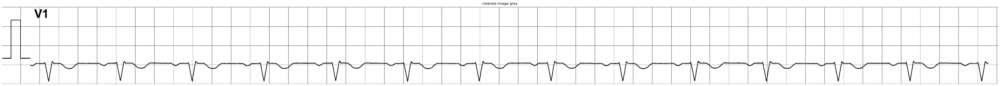

In [8]:
plt.figure(figsize=(60, 10))  # Adjust width and height as needed
plt.imshow(img_gray_filtered, cmap='gray')
plt.title("cleaned image grey")
plt.axis('off')
plt.show()

In [9]:
# Create an image that keeps zeros and sets non-zero pixels to white (255)
img_zeros_only = np.full_like(img_gray_filtered, 255)
img_zeros_only[img_gray_filtered == 0] = 0

# Create an image that keeps non-zero pixel values and sets zeros to white (255)
img_nonzeros = np.full_like(img_gray_filtered, 255)
img_nonzeros[img_gray_filtered != 0] = img_gray_filtered[img_gray_filtered != 0]


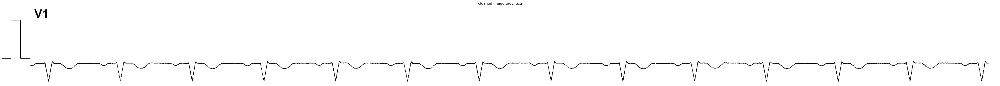

In [10]:
plt.figure(figsize=(60, 10))  # Adjust width and height as needed
plt.imshow(img_zeros_only, cmap='gray')
plt.title("cleaned image grey: ecg")
plt.axis('off')
plt.show()

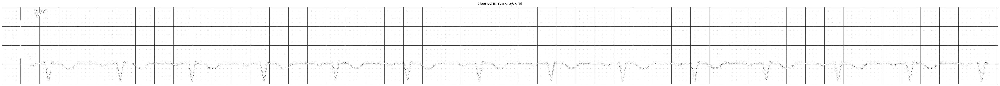

In [11]:
plt.figure(figsize=(60, 10))  # Adjust width and height as needed
plt.imshow(img_nonzeros, cmap='gray')
plt.title("cleaned image grey: grid")
plt.axis('off')
plt.show()

In [217]:
def extract_waveform(cleaned_gray):
    # binarize (waveform is dark)
    _, bw = cv2.threshold(cleaned_gray, 0, 255,
                          cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    # skeletonize expects boolean
    bw_bool = bw > 0
    skel = skeletonize(bw_bool).astype(np.uint8)
    return skel
def column_to_trace(skel):
    h, w = skel.shape
    ys = np.full(w, np.nan)
    for x in range(w):
        ys_in_col = np.where(skel[:,x]>0)[0]
        if len(ys_in_col):
            # take mean y if multiple branches
            ys[x] = ys_in_col.mean()
    return ys
def pixels_to_physical(xs, ys, pixels_per_mm=10,
                       time_per_mm=0.04,  # 25mm/s => 1mm = 0.04s
                       volt_per_mm=0.1,   # 10mm/mV => 1mm = 0.1mV
                       baseline_y=None):
    # if baseline_y not given, take median of all ys as zero-line
    if baseline_y is None:
        baseline_y = np.nanmedian(ys)
    # compute time and voltage arrays
    t = (xs / pixels_per_mm) * time_per_mm
    v = ((baseline_y - ys) / pixels_per_mm) * volt_per_mm
    return t, v


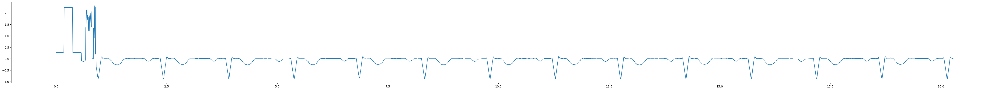

In [218]:

skel = extract_waveform(img_zeros_only)
ys = column_to_trace(skel)
xs = np.arange(len(ys))
t, v = pixels_to_physical(xs, ys, pixels_per_mm=10)
plt.figure(figsize=(60, 5))  # Set the width to 10 and height to 6
sns.lineplot(x=t, y=v)
plt.show()